# Tutorial 6.2.3.Turbulence Generation with Perlin Noise

Project: Structural Wind Engineering WS20-21 
        Chair of Structural Analysis @ TUM - R. Wüchner, M. Péntek, A. Kodakkal

Author: Ammar Khallouf

Created on:  14.12.2020

Last Update: 17.12.2020

####  Content:


Perlin Noise is a procedural generation algorithm invented by **_Ken Perlin (1983)_.** 
It is especially used in games industry and other visual media such as movies.  It can be used to generate things like textures and terrain procedurally, meaning without them being manually made by an artist or designer. The algorithm can have 1 or more dimensions.

In the context of Wind engineering, We will use this method here to generate a turbulent-like flow structures for *visualization purposes only*. 

To add fluid mechanics to the problem, we will solve the *linear advection equation* on a 2D grid using finite difference for simplicity. The perlin noise is imposed over portion
of the grid to create perturbations in the velocity field. The flow field is then animated over time.

####  Requirements:

To run this exercise you will require the following libraries:

1. ***noise***: python library for Perlin Noise, can be installed using: ``` pip install noise ```
   or as Conda Package :https://anaconda.org/conda-forge/noise

2. ***FFmpeg***: multimedia framework for creating animations, install from : https://ffmpeg.org/download.html

####  References:
[1] _Biagioli, A. (2014). Understanding perlin noise https://adrianb.io/2014/08/09/perlinnoise.html._


In [1]:
# Import required python modules.
import noise
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
plt.rcParams['animation.html'] = 'html5'
import matplotlib.animation as animation
from matplotlib import cm


#### 1. Define the 2D fluid domain dimensions and create the mesh

In [2]:
# Assign size of the fluid domain and number of grids

nx = 81 #No. of edges along x-direction.
ny = 81 #No. of edges along y-direction.
Lx = 1.0 # Length of domain along x-direction. 
Ly = 1.0 # Length of domain along y-direction.

x = np.linspace(0,Lx,nx) # create a grid along x-direction.
y = np.linspace(0,Ly,ny) # create a grid along y-direction.

dx = Lx/(nx-1) # grid spacing along x-direction.
dy = Ly/(ny-1) # grid spacing along y-direction.

# create a grid of coordinates
xx,yy = np.meshgrid(x,y)

#### 2. Initialize and plot the 2D veloicity field:  $u_0(x,y)$

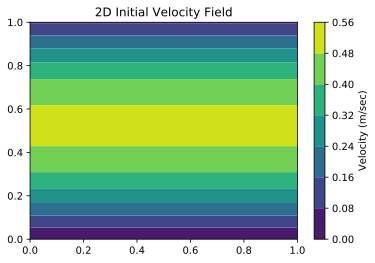

In [3]:
# Let's initialize the velocity field u0(x,y) with some symbolic function:
# You can also use a custom function of your choice.

u0 = lambda x,y : 0.5*np.sin(3*y) # initialize velocity field

# Custom functions to try later :
#u0 = lambda x,y : 0.5*(y)**0.6 # initialize velocity field

# plot the initial velocity condition
plt.contourf(xx,yy,u0(xx,yy));
cbar_c = plt.colorbar();
cbar_c.ax.set_ylabel('Velocity (m/sec)');
plt.title('2D Initial Velocity Field');



#### 3. Setup the simulation parameters for solving the 2D linear Advection equation



In [4]:
# Assign advection velocity components.
cx = 0.25
cy = 0.0

dt = 0.002 # -> time step size in seconds, (select a reasonable small value for stable nunerical scheme).
tend = 1.0 # -> duration of simulation in seconds. 
t = 0 # -> start time.

cflx = cx * dt/dx #-> cfl condition constant in x-direction.
cfly = cy * dt/dy #-> cfl condition constant in y-direction.

# setup the solution vector and append initial state of the flow.
sol = []
u = np.zeros([ny+2,nx+2]) 
u[1:-1, 1:-1] = u0(xx,yy)

# set periodic boundaries
u[:,0] = u[:,-3] #x-minus face
u[:,-1] = u[:,2] #x-plus face
u[0,:] = u[-3,:] #y-minus face
u[-1,:] = u[2,:] #y-plus face
sol.append(u)


#### 4. Setup a 2D Turbulence field using Perlin algorithm and add it to the velocity field

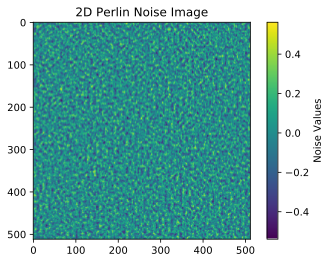

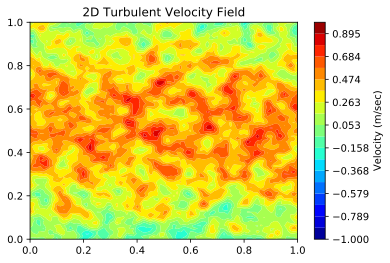

In [5]:
# set the dimensions for the 2D Perlin noise image (e.g 1024x1024, 512x512 or same size as fluid domain) 

xdim = 512
ydim = 512

# Initialize a 2D array for Turbulence with zeros
Turb = np.zeros(([xdim,ydim])) 

# Perlin noise generation settings :

scale = 7.0 # -> determines at what distance to view the noisemap.
octaves = 6 # -> noise resolution.
persistence = 0.5  # -> adjusts amplitude.
lacunarity = 2.0 # -> adjusts frequency.

# Note: first two inputs of pnoise2 have to be between 0 and 1. Otherwise, the function returns 0 without complaining.

# Generate Turbulence with perlin noise:

u[1:-1, 1:-1] = u0(xx,yy)

for i in range(ydim):
    for j in range(xdim):
        Turb[i][j] = noise.pnoise2(i/scale,j/scale, octaves=octaves,persistence=persistence,lacunarity=lacunarity,                                    repeatx=1024, 
                                   repeaty=1024,base=0)
        
# Patch the velociy field with Turbulence: (Note: the indicies control the extent of the patch)

# Patch The whole domain
u[1:-1, 1:-1] = u[1:-1, 1:-1] + Turb[0:nx, 0:ny]

# Patch near the right edge
#u[1:ny, 1:21] = u[1:ny, 1:21] + Turb[0:ny-1, 0:20]

# Plot the Turbulence image (xdim,ydim)
plt.imshow(Turb)
cbar_i = plt.colorbar()
cbar_i.set_label('Noise Values')
plt.title('2D Perlin Noise Image')
plt.show()

# Plot the patched velocity field (nx,ny)
im_turb = plt.contourf(xx,yy,u[1:-1,1:-1],cmap=cm.jet,levels=np.linspace(-1,1,20))
cbar_t = plt.colorbar()
cbar_t.set_label('Velocity (m/sec)')
plt.title('2D Turbulent Velocity Field')
plt.show()


#### 4. Run the transient simulation using Finte Difference scheme  (Forward in Time, Backward in Space)

In [6]:
print ("begin simulation...")
while t < tend:
    un = sol[-1]
    unew = un.copy()
    unew[1:-1,1:-1] = un[1:-1,1:-1] - cflx * (un[1:-1,1:-1] - un[1:-1,:-2]) - cfly * (un[1:-1,1:-1] - un[:-2,1:-1])
    # set periodic boundaries
    unew[:,0] = unew[:,-3] #x-minus face
    unew[:,-1] = unew[:,2] #x-plus face
    unew[0,:] = unew[-3,:] #y-minus face
    unew[-1,:] = unew[2,:] #y-plus face

    sol.append(unew)
    t += dt
print ("end simulation...")

begin simulation...
end simulation...


#### 5. Plot the solution for velocity field at last time step and play an animation of solution over time. Observe the convection of the turbulent fluctuations downstream.

*Note: This can take a while to execute depending on number of steps requested.*

In [7]:
# Create animation stack using ffmpeg
fig = plt.figure(figsize=(8,5),facecolor='w')
ims = []
levs = np.linspace(-1,1,20)
i = 0
t = 0.0

# Loop over solution vector and form snapshots
for solution in sol:    
    if (i%10==0):        
        #im = plt.contourf(xx,yy,solution[1:-1,1:-1],cmap=cm.jet,levels=levs,vmax=1.0,vmin=-1.0)
        im = plt.contourf(xx,yy,solution[1:-1,1:-1],cmap=cm.jet,levels=levs)
        ims.append(im.collections)
    i+=1
    t += dt

# Animation settings
cbar = plt.colorbar()
plt.clim(-1,1)
cbar.set_ticks(np.linspace(-1,1,5))
cbar.ax.set_ylabel('Velocity (m/sec)')
plt.title("2D Solution Velocity Field")

plt.show()

ani = animation.ArtistAnimation(fig, ims);

ani


#### 6. Repeat the script with:
- Different initialization settings for Perlin noise and velocity field.
- Different values for time step (dt) and convective velocities (cx ,cy)
- Different mesh dimensions (nx ,ny)

#### 7.  What observations can be made from the animation of the velocity field?
#### 8.  Is the observed solution consistent with that of a linear convection problem?  Why?

